In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import shapely as shp
import matplotlib.patheffects as PathEffects
% matplotlib inline

# loading the data for injuries (step by step)

### loading injuries data

In [2]:
df = pd.read_csv('./TASA.csv')
df.dropna(inplace = True)

In [3]:
pd.options.display.max_columns = None

In [4]:
df.head()

,month,month_name,region,sum_injuries,male_injuries,female_injuries,urban_injuries,suburban_injuries,injuries_0_18,injuries_18_30,injuries_30_40,injuries_40_50,injuries_50,injuries_saudi,injuries_foreign,sum_dead,male_dead,female_dead,urban_dead,suburban_dead,dead_0_18,dead_18_30,dead_30_40,dead_40_50,dead_50,dead_saudi,dead_foreign,sum_accidents,sum_involved,acc_damages,acc_injuries,acc_dead,Saturday,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,day,night,urban,suburban,small_car,jeep,bus,pickup,truck,water_truck,other,involved_0_18,involved_18_30,involved_30_40,involved_40_50,involved_50,involved_saudi,involved_foreign,involved_married,involved_single,involved_litrate,involved_illitrate,private_license,public_license,machine_license,bike_license,no_license,sum_license,valid_license,expired_license,type_car_hit,type_object_hit,type_pedestrain_hit,type_animal_hit,type_Fire,type_rollover,type_offroad_diviation,type_other,cause_illegal_parking_stop,cause_illegal_turn,cause_illegal_crossing,cause_traffic_light_break,cause_speeding,cause_drug_use,cause_other,injuries_total,dead_total,intact_total,??? ??????? ??? ??? ????? ???????
0,1.0,Moharram,Ar Riyad,393.0,364.0,29.0,291.0,102.0,66.0,97.0,126.0,73.0,31.0,213.0,180.0,100.0,95.0,5.0,54.0,46.0,9.0,38.0,27.0,12.0,14.0,46.0,54.0,5399.0,12928.0,5047.0,277.0,75.0,919.0,781.0,625.0,814.0,702.0,775.0,783.0,2819.0,2580.0,2452.0,2947.0,1214.0,1561.0,63.0,984.0,1475.0,102.0,0.0,2417.0,4583.0,4390.0,1264.0,274.0,9522.0,3406.0,8115.0,4813.0,12901.0,27.0,7892.0,2480.0,0.0,0.0,2556.0,12928.0,8611.0,1761.0,1647.0,1542.0,0.0,1.0,0.0,1132.0,261.0,816.0,1022.0,974.0,891.0,1208.0,1304.0,0.0,0.0,393.0,100.0,12435.0,1.33
1,2.0,Safar,Ar Riyad,433.0,387.0,46.0,276.0,157.0,44.0,117.0,145.0,79.0,48.0,271.0,162.0,98.0,93.0,5.0,57.0,41.0,9.0,38.0,25.0,14.0,12.0,46.0,52.0,6274.0,9641.0,5941.0,255.0,78.0,1427.0,1407.0,1434.0,857.0,421.0,388.0,340.0,4589.0,1685.0,5367.0,907.0,849.0,663.0,45.0,79.0,1062.0,55.0,0.0,1843.0,2281.0,2452.0,2053.0,1012.0,5968.0,3673.0,4883.0,4758.0,9594.0,47.0,5072.0,2375.0,0.0,0.0,2194.0,9641.0,5796.0,1651.0,2287.0,2274.0,0.0,3.0,0.0,1331.0,117.0,262.0,1700.0,1940.0,898.0,739.0,997.0,0.0,0.0,433.0,98.0,9110.0,1.26
2,3.0,Rabeea Awal,Ar Riyad,455.0,361.0,94.0,284.0,171.0,115.0,124.0,108.0,89.0,19.0,278.0,177.0,105.0,94.0,11.0,49.0,56.0,22.0,13.0,35.0,24.0,11.0,59.0,46.0,8166.0,15945.0,7808.0,271.0,87.0,1209.0,1435.0,1121.0,1122.0,1140.0,1063.0,1076.0,4896.0,3270.0,3987.0,4179.0,2377.0,1648.0,422.0,1763.0,1055.0,901.0,0.0,2722.0,3833.0,3697.0,3841.0,1852.0,9576.0,6369.0,10286.0,5659.0,15844.0,101.0,6947.0,4399.0,0.0,0.0,4599.0,15945.0,9285.0,2061.0,3195.0,2286.0,0.0,2.0,0.0,566.0,546.0,1571.0,1669.0,1418.0,1255.0,1380.0,2444.0,0.0,0.0,455.0,105.0,15385.0,1.21
3,4.0,Rabeea Thany,Ar Riyad,427.0,378.0,49.0,295.0,132.0,132.0,119.0,103.0,51.0,22.0,238.0,189.0,91.0,85.0,6.0,46.0,45.0,29.0,22.0,19.0,13.0,8.0,49.0,42.0,8166.0,15699.0,7821.0,266.0,79.0,1368.0,1436.0,1094.0,1054.0,1085.0,1076.0,1053.0,4274.0,3892.0,4501.0,3665.0,2114.0,1648.0,758.0,1789.0,1147.0,710.0,0.0,2855.0,3796.0,3541.0,3280.0,1709.0,8645.0,6536.0,10223.0,4958.0,14894.0,287.0,6685.0,4277.0,0.0,0.0,4219.0,15181.0,8141.0,2821.0,3398.0,2118.0,0.0,0.0,2.0,524.0,547.0,1577.0,1688.0,1608.0,1512.0,1366.0,1992.0,0.0,0.0,427.0,91.0,15181.0,1.15
4,5.0,Jamad Awal,Ar Riyad,358.0,311.0,47.0,262.0,96.0,61.0,111.0,89.0,52.0,45.0,207.0,151.0,96.0,95.0,1.0,51.0,45.0,15.0,35.0,26.0,12.0,8.0,52.0,44.0,8241.0,15891.0,7923.0,237.0,81.0,1410.0,1298.0,1014.0,1088.0,1110.0,1125.0,1196.0,4321.0,3920.0,4320.0,3921.0,2118.0,1759.0,512.0,1923.0,1126.0,803.0,0.0,2844.0,3862.0,3623.0,3841.0,1721.0,9428.0,6463.0,10322.0,5569.0,15819.0,72.0,6544.0,4377.0,0.0,0.0,4970.0,15891.0,8176.0,2745.0,3973.0,2387.0,0.0,1.0,1.0,526.0,639.0,714.0,1758.0,1511.0,1318.0,1426.0,2228.0,0.0,0.0,358.0,96.0,15437.0,1.19


In [5]:
df.month_name.unique()

array(['Moharram', 'Safar', 'Rabeea Awal', 'Rabeea Thany', 'Jamad Awal',
       'Jamad Thany', 'Ragab', ' Shaaban', ' Ramadan', ' Shawwal',
       'Zy Aqedada', 'Zy Alhegga'], dtype=object)

In [6]:
month_inj = df.pivot_table(index = 'region', columns = 'month_name', values = 'sum_injuries')[['Moharram', 'Safar', 'Rabeea Awal',
        'Rabeea Thany', 'Jamad Awal','Jamad Thany', 'Ragab', ' Shaaban', ' Ramadan', ' Shawwal',
       'Zy Aqedada', 'Zy Alhegga']].reset_index()
month_inj.head()

month_name,region,Moharram,Safar,Rabeea Awal,Rabeea Thany,Jamad Awal,Jamad Thany,Ragab,Shaaban,Ramadan,Shawwal,Zy Aqedada,Zy Alhegga
0,Al-Baha,78.0,67.0,67.0,67.0,106.0,67.0,82.0,73.0,84.0,89.0,78.0,77.0
1,Al-Jouf,34.0,36.0,25.0,20.0,20.0,23.0,21.0,27.0,26.0,26.0,19.0,37.0
2,Al-Qurayyat,27.0,40.0,30.0,23.0,23.0,14.0,29.0,22.0,39.0,16.0,19.0,22.0
3,Ar Riyad,393.0,433.0,455.0,427.0,358.0,379.0,383.0,393.0,335.0,384.0,313.0,301.0
4,Aseer,227.0,240.0,163.0,151.0,209.0,162.0,193.0,149.0,143.0,216.0,156.0,183.0
5,Ash Sharqiyah,218.0,274.0,271.0,294.0,238.0,229.0,267.0,276.0,218.0,224.0,212.0,248.0
6,At-Taif,270.0,290.0,365.0,286.0,247.0,271.0,279.0,300.0,383.0,309.0,289.0,277.0
7,Hail,47.0,56.0,60.0,79.0,53.0,63.0,83.0,126.0,98.0,123.0,62.0,62.0
8,Jazan,245.0,210.0,201.0,180.0,135.0,137.0,138.0,173.0,202.0,163.0,184.0,144.0
9,Jiddah,211.0,206.0,273.0,228.0,199.0,241.0,219.0,298.0,337.0,260.0,239.0,254.0


### get the locational data and population count from another dataframe

In [ ]:
overview = gpd.read_file('./overview.geojson')

In [8]:
overview.head(1)

,NAME,TOTPOP_CY,x,y,Total injuries,Total mortalities,Number of traffic accidents,Number of people involved in traffic accidents,Number of Accidents including damages,Number of Accidents including injuries,Number of Accidents including mortalities,Percentage of Accidents including damages,Percentage of Accidents including injuries,Percentage of Accidents including mortalities,Accidents per 1000 population,Involvment in traffic accidents per 1000 population,Injuries 1000 population,Mortalities per 1000 population,geometry
0,Makkah,3261577,-398222.616706,2.366203e+06,3400.0,609.0,44915.0,88472.0,43146.0,1311.0,458.0,96.061449,2.918847,1.019704,13.770946,27.125529,1.042441,0.186719,MULTIPOLYGON Z (((-456710.530 2650896.255 0.00...


In [9]:
overview[['NAME','TOTPOP_CY','geometry']]

,NAME,TOTPOP_CY,geometry
0,Makkah,3261577,MULTIPOLYGON Z (((-456710.530 2650896.255 0.00...
1,Aseer,2264096,MULTIPOLYGON Z (((-308858.199 2319738.780 0.00...
2,Tabouk,962936,MULTIPOLYGON Z (((-789203.443 3344744.803 0.00...
3,Jazan,1643752,MULTIPOLYGON Z (((-419719.167 1993300.107 0.00...
4,Al-Baha,500452,"POLYGON Z ((-497258.929 2331363.256 0.000, -49..."
5,Al-Jouf,357976,MULTIPOLYGON Z (((-674276.585 3486918.942 0.00...
6,Madinah,2193344,MULTIPOLYGON Z (((-889704.041 3115476.411 0.00...
7,Qaseem,1491045,"POLYGON Z ((-477698.887 2859824.348 0.000, -47..."
8,Ash Sharqiyah,4494027,"POLYGON Z ((483440.905 2736363.772 0.000, 4839..."
9,Hail,728034,"POLYGON Z ((-670450.843 3184778.644 0.000, -67..."


In [10]:
temp_inj = pd.merge(overview[['NAME','TOTPOP_CY','geometry']],month_inj,
         left_on= 'NAME', right_on='region', right_index=False).drop(columns = 'region')
temp_inj.head(2)

,NAME,TOTPOP_CY,geometry,Moharram,Safar,Rabeea Awal,Rabeea Thany,Jamad Awal,Jamad Thany,Ragab,Shaaban,Ramadan,Shawwal,Zy Aqedada,Zy Alhegga
0,Makkah,3261577,MULTIPOLYGON Z (((-456710.530 2650896.255 0.00...,235.0,224.0,303.0,259.0,256.0,221.0,375.0,265.0,391.0,280.0,253.0,338.0
1,Aseer,2264096,MULTIPOLYGON Z (((-308858.199 2319738.780 0.00...,227.0,240.0,163.0,151.0,209.0,162.0,193.0,149.0,143.0,216.0,156.0,183.0


<AxesSubplot:>

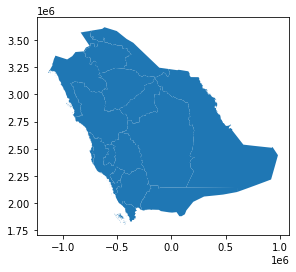

In [11]:
temp_inj.plot()

### visualize local moran clustering using Moran scatter plot and maps

In [22]:
from splot.esda import moran_scatterplot
from esda.moran import Moran_Local
import libpysal.weights as weights

In [24]:
np.random.seed(1)
# we choose an adaptive kernel by setting fixed = False
# the variable 'k' determines the number of neighbours to be considred while calculating the kerel threshold using knn function
# I am using 'gaussian' kernel
w = weights.Kernel.from_dataframe(temp_inj, k=4, fixed = False, function = 'gaussian')
w.transform = 'r'
y = temp_inj.Moharram.values

In [25]:
# calculate Moran_Local statistic and plot
moran_loc = Moran_Local(y, w )

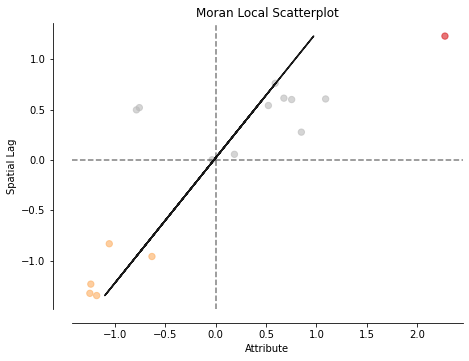

In [26]:
fig, ax = moran_scatterplot(moran_loc,p = 0.05)
plt.show()

In [27]:
from splot.esda import lisa_cluster

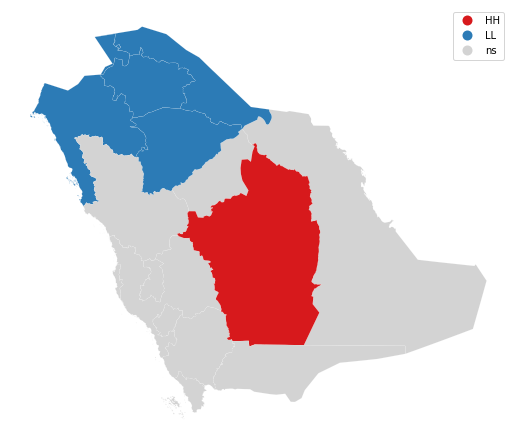

In [28]:
from splot.esda import lisa_cluster

lisa_cluster(moran_loc, temp_inj, p=0.05, figsize = (9,9))
plt.show()

#### Using different cutout values

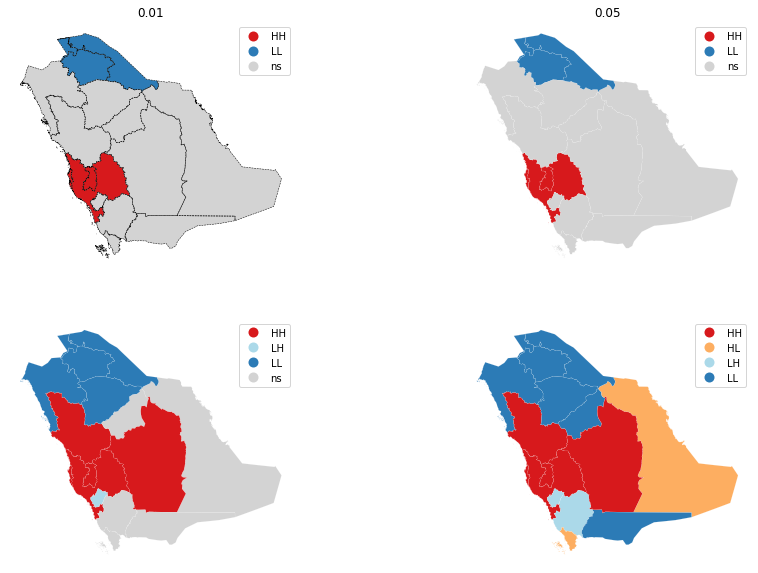

In [329]:
np.random.seed(1)
df = temp_inj.iloc[:,3:].copy()
w = weights.Kernel.from_dataframe(temp_inj, k=4, fixed = False, function = 'gaussian')
w.transform = 'r'
y = df[' Ramadan'].values
moran_loc = Moran_Local(y, w )

fig,axs = plt.subplots(2,2,figsize = (15,10))
lisa_cluster(moran_loc, temp_inj,p=0.01, ax = axs[0,0])
temp_inj.plot(ax=axs[0,0], edgecolor = 'k', linestyle='--', linewidth=0.5, facecolor='None')
axs[0,0].set_title('0.01')
lisa_cluster(moran_loc, temp_inj,p=0.05, ax = axs[0,1])
axs[0,1].set_title('0.05')
lisa_cluster(moran_loc, temp_inj,p=0.1, ax = axs[1,0])
axs[1,0].set_title('0.1')
lisa_cluster(moran_loc, temp_inj,p=0.5, ax = axs[1,1])
axs[1,1].set_title('0.5')
plt.show()

# Hotspot detection of traffic accidents' attributes

## Injuries analysis (total number and per capita)

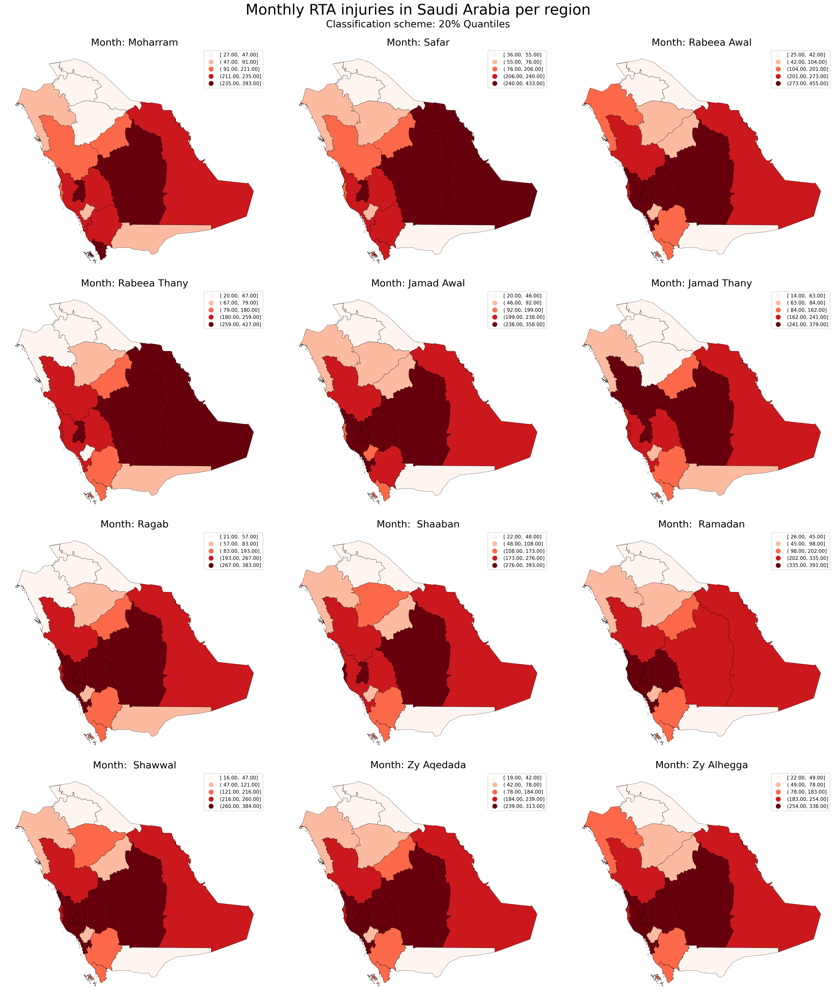

In [402]:
df = temp_inj.copy()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA injuries in Saudi Arabia per region', size = 30, y=1.01)
plt.figtext(0.5,0.986,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.tight_layout()
plt.show()

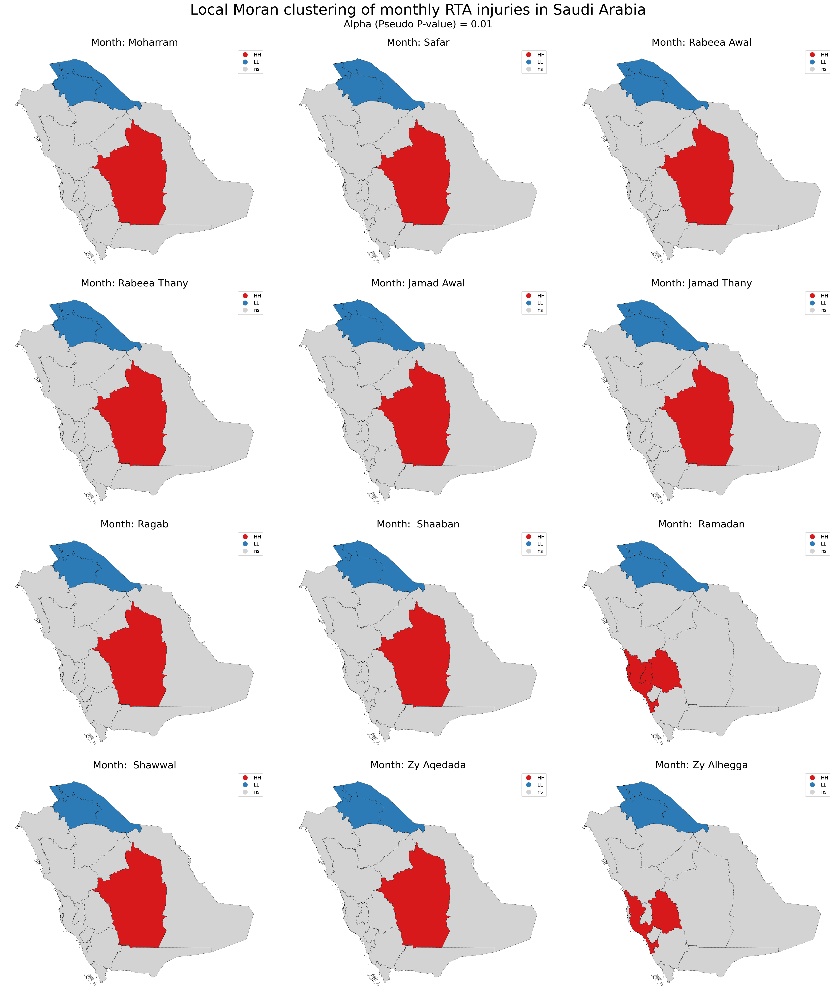

In [403]:
np.random.seed(1)

df= temp_inj.copy()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia', size = 30, y=1.01)
plt.figtext(0.5,0.986,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.tight_layout()
plt.show()

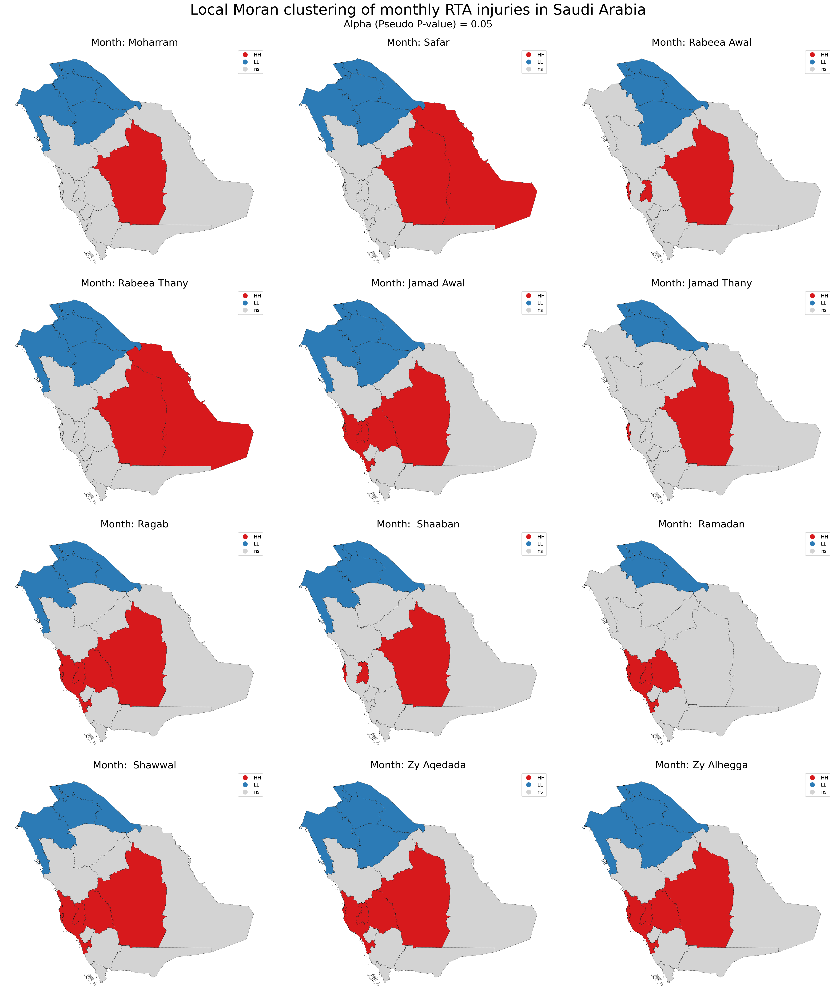

In [404]:
np.random.seed(1)

df= temp_inj.copy()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, temp_inj,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia', size = 30, y=1.01)
plt.figtext(0.5,0.986,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.tight_layout()
plt.show()

In [413]:
temp_inj_per10000 = temp_inj.copy()

temp_inj_per10000.iloc[:,3:] = temp_inj_per10000.iloc[:,3:]*10000

for i in np.arange(len(temp_inj_per10000)):
    temp_inj_per10000.iloc[i,3:] = temp_inj_per10000.iloc[i,3:]/ temp_inj_per10000.iloc[i,1]

temp_inj_per10000.head()

,NAME,TOTPOP_CY,geometry,Moharram,Safar,Rabeea Awal,Rabeea Thany,Jamad Awal,Jamad Thany,Ragab,Shaaban,Ramadan,Shawwal,Zy Aqedada,Zy Alhegga
0,Makkah,3261577,MULTIPOLYGON Z (((-456710.530 2650896.255 0.00...,0.720510,0.686784,0.928998,0.794094,0.784896,0.677586,1.149751,0.812490,1.198807,0.858480,0.775698,1.036309
1,Aseer,2264096,MULTIPOLYGON Z (((-308858.199 2319738.780 0.00...,1.002608,1.060026,0.719934,0.666933,0.923106,0.715517,0.852437,0.658099,0.631599,0.954023,0.689017,0.808270
2,Tabouk,962936,MULTIPOLYGON Z (((-789203.443 3344744.803 0.00...,0.945026,0.789253,1.339653,0.695789,0.955411,0.872332,0.591940,0.799638,0.851562,0.758098,0.643864,0.903487
3,Jazan,1643752,MULTIPOLYGON Z (((-419719.167 1993300.107 0.00...,1.490492,1.277565,1.222812,1.095056,0.821292,0.833459,0.839543,1.052470,1.228896,0.991634,1.119390,0.876045
4,Al-Baha,500452,"POLYGON Z ((-497258.929 2331363.256 0.000, -49...",1.558591,1.338790,1.338790,1.338790,2.118085,1.338790,1.638519,1.458681,1.678483,1.778392,1.558591,1.538609


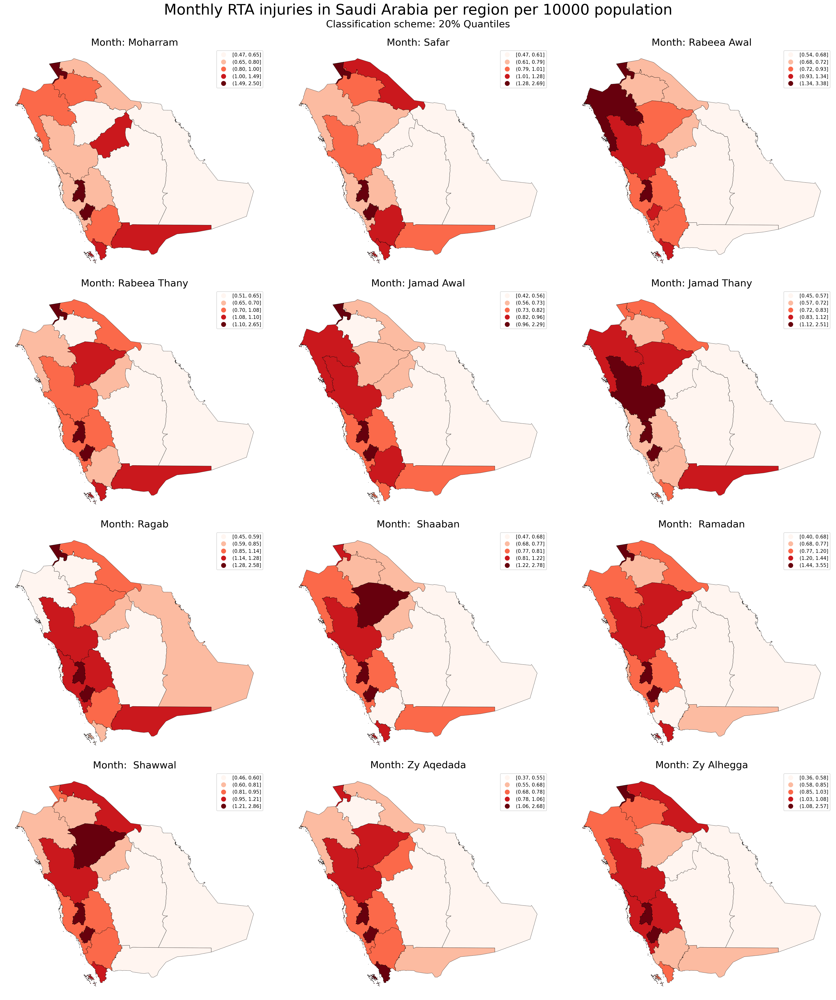

In [414]:
df = temp_inj_per10000.copy()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA injuries in Saudi Arabia per region per 10000 population', size = 30, y=1.01)
plt.figtext(0.5,0.986,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.tight_layout()
plt.show()

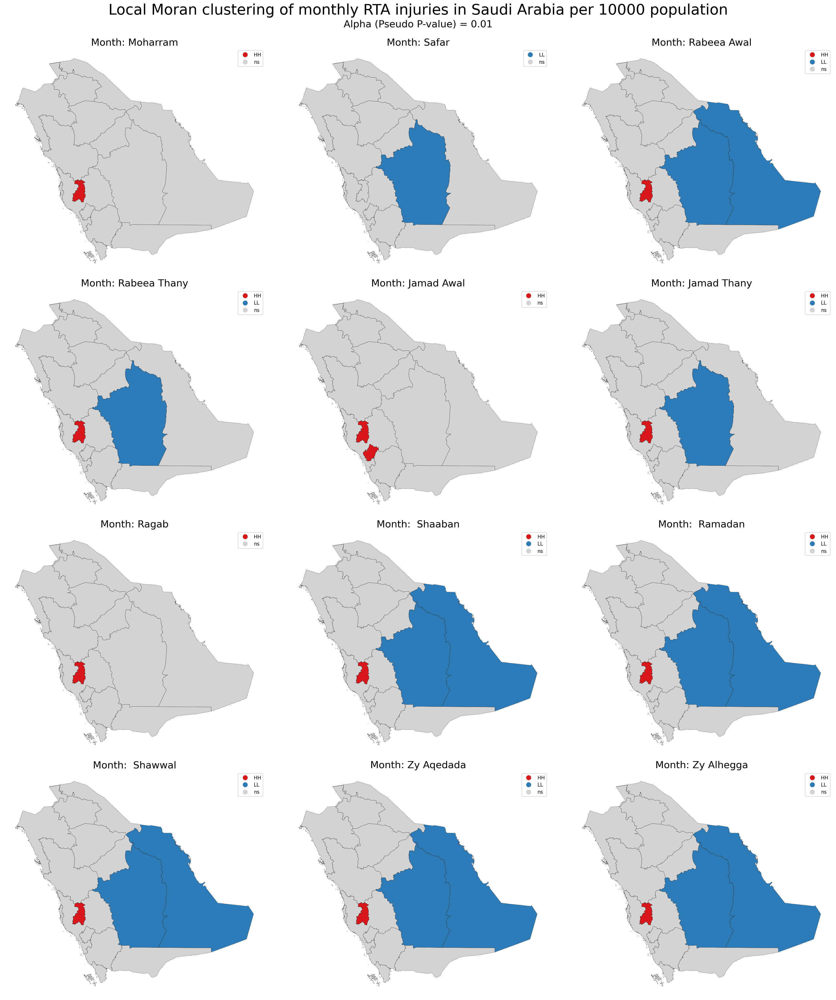

In [417]:
np.random.seed(1)

df= temp_inj_per10000.copy()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia per 10000 population', size = 30, y=1.01)
plt.figtext(0.5,0.986,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.tight_layout()
plt.show()

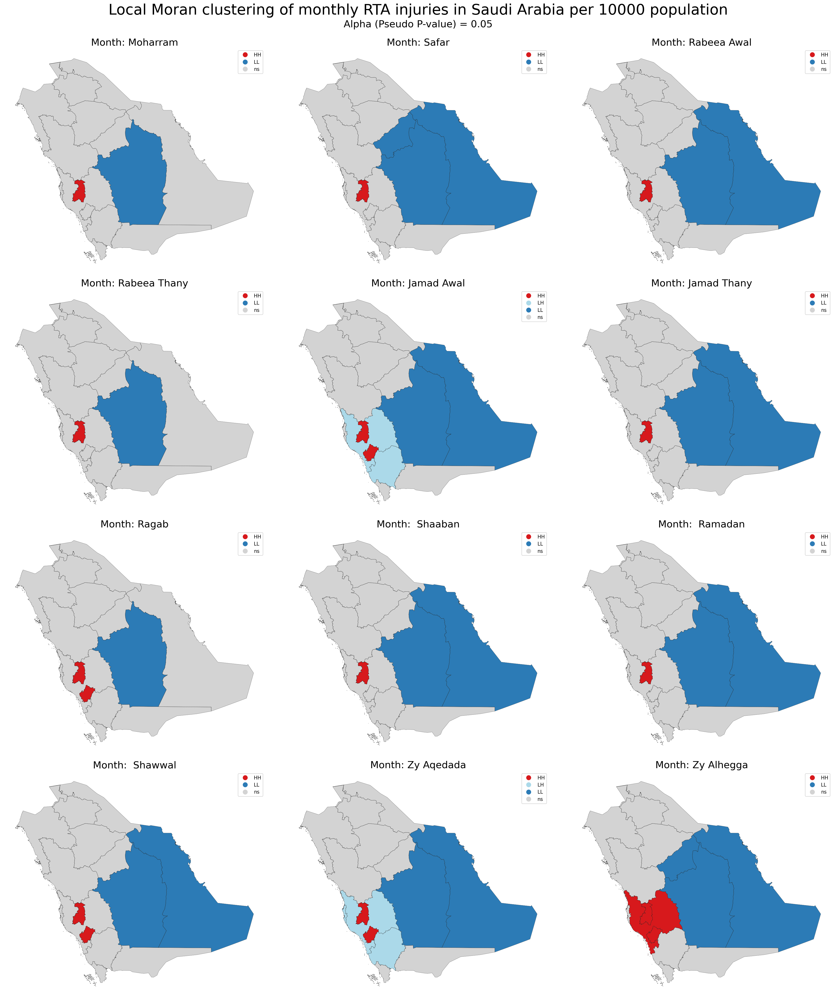

In [418]:
np.random.seed(1)

df= temp_inj_per10000.copy()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia per 10000 population', size = 30, y=1.01)
plt.figtext(0.5,0.986,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.tight_layout()
plt.show()

# Hotspot detection of traffic accidents' attributes (direct)

# Injuries analysis

In [440]:
#loading the dataset
df = pd.read_csv('./TASA.csv')
df.dropna(inplace = True)
df.replace('Zy Aqedada', 'Zy Aqeaada', inplace = True)
overview = gpd.read_file('./overview.geojson')

#isolating the needed variable

month_inj = df.pivot_table(index = 'region', columns = 'month_name', values = 'sum_injuries')[['Moharram', 'Safar', 'Rabeea Awal',
        'Rabeea Thany', 'Jamad Awal','Jamad Thany', 'Ragab', ' Shaaban', ' Ramadan', ' Shawwal',
       'Zy Aqeaada', 'Zy Alhegga']].reset_index()
temp_inj = pd.merge(overview[['NAME','TOTPOP_CY','geometry']],month_inj,
         left_on= 'NAME', right_on='region', right_index=False).drop(columns = 'region')

# calculating the variable values per 10000 population
temp_inj_per10000 = temp_inj.copy()

temp_inj_per10000.iloc[:,3:] = temp_inj_per10000.iloc[:,3:]*10000

for i in np.arange(len(temp_inj_per10000)):
    temp_inj_per10000.iloc[i,3:] = temp_inj_per10000.iloc[i,3:]/ temp_inj_per10000.iloc[i,1]

In [441]:
np.random.seed(1)

df = temp_inj.copy()

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

#plotting the quantiles distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA injuries in Saudi Arabia per region', size = 30, y=0.96)
plt.figtext(0.5,0.93,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/injuries_tot.jpg')
plt.close()


#plotting the lisa distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/injuries_tot_lisa_'+str(alpha)+'.jpg')
plt.close()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/injuries_tot_lisa_'+str(alpha)+'.jpg')
plt.close()

# plotting the per 10000 distribution

df = temp_inj_per10000.copy()

#plotting the quantiles distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA injuries in Saudi Arabia per region per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/injuries_10000.jpg')
plt.close()


#plotting the lisa distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/injuries_10000_lisa_'+str(alpha)+'.jpg')
plt.close()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA injuries in Saudi Arabia per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/injuries_10000_lisa_'+str(alpha)+'.jpg')
plt.close()

# Mortalities analysis

In [442]:
#loading the dataset
df = pd.read_csv('./TASA.csv')
df.dropna(inplace = True)
df.replace('Zy Aqedada', 'Zy Aqeaada', inplace = True)
overview = gpd.read_file('./overview.geojson')


#isolating the needed variable

variable = 'mortalities'

month_mort = df.pivot_table(index = 'region', columns = 'month_name', values = 'sum_dead')[['Moharram', 'Safar', 'Rabeea Awal',
        'Rabeea Thany', 'Jamad Awal','Jamad Thany', 'Ragab', ' Shaaban', ' Ramadan', ' Shawwal',
       'Zy Aqeaada', 'Zy Alhegga']].reset_index()
temp_mort = pd.merge(overview[['NAME','TOTPOP_CY','geometry']],month_mort,
         left_on= 'NAME', right_on='region', right_index=False).drop(columns = 'region')

# calculating the variable values per 10000 population
temp_mort_per10000 = temp_mort.copy()

temp_mort_per10000.iloc[:,3:] = temp_mort_per10000.iloc[:,3:]*10000

for i in np.arange(len(temp_mort_per10000)):
    temp_mort_per10000.iloc[i,3:] = temp_mort_per10000.iloc[i,3:]/ temp_mort_per10000.iloc[i,1]

In [443]:
np.random.seed(1)

df = temp_mort.copy()

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

#plotting the quantiles distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA mortalities in Saudi Arabia per region', size = 30, y=0.96)
plt.figtext(0.5,0.93,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/mortalities_tot.jpg')
plt.close()


#plotting the lisa distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA mortalities in Saudi Arabia', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/mortalities_tot_lisa_'+str(alpha)+'.jpg')
plt.close()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA mortalities in Saudi Arabia', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/mortalities_tot_lisa_'+str(alpha)+'.jpg')
plt.close()

# plotting the per 10000 distribution

df = temp_mort_per10000.copy()

#plotting the quantiles distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA mortalities in Saudi Arabia per region per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/mortalities_10000.jpg')
plt.close()


#plotting the lisa distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA mortalities in Saudi Arabia per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/mortalities_10000_lisa_'+str(alpha)+'.jpg')
plt.close()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA mortalities in Saudi Arabia per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/mortalities_10000_lisa_'+str(alpha)+'.jpg')
plt.close()

# Total number of accidents

In [10]:
#loading the dataset
df = pd.read_csv('./TASA.csv')
df.dropna(inplace = True)
df.replace('Zy Aqedada', 'Zy Aqeaada', inplace = True)
overview = gpd.read_file('./overview.geojson')

#isolating the needed variable

variable = 'occurance'

month_mort = df.pivot_table(index = 'region', columns = 'month_name', values = 'sum_accidents')[['Moharram', 'Safar', 'Rabeea Awal',
        'Rabeea Thany', 'Jamad Awal','Jamad Thany', 'Ragab', ' Shaaban', ' Ramadan', ' Shawwal',
       'Zy Aqeaada', 'Zy Alhegga']].reset_index()
temp_mort = pd.merge(overview[['NAME','TOTPOP_CY','geometry']],month_mort,
         left_on= 'NAME', right_on='region', right_index=False).drop(columns = 'region')

# calculating the variable values per 10000 population
temp_mort_per10000 = temp_mort.copy()

temp_mort_per10000.iloc[:,3:] = temp_mort_per10000.iloc[:,3:]*10000

for i in np.arange(len(temp_mort_per10000)):
    temp_mort_per10000.iloc[i,3:] = temp_mort_per10000.iloc[i,3:]/ temp_mort_per10000.iloc[i,1]

In [13]:
np.random.seed(1)

df = temp_mort.copy()

columns = [0,1,2]*4
rows = []
for i in np.arange(4):
    nl = [i]*3
    rows = rows+nl

months = list(df.iloc[:,3:])

#plotting the quantiles distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA '+ variable + ' in Saudi Arabia per region', size = 30, y=0.96)
plt.figtext(0.5,0.93,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/'+ variable + '_tot.jpg')
plt.close()


#plotting the lisa distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA '+ variable + ' in Saudi Arabia', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/'+ variable + '_tot_lisa_'+str(alpha)+'.jpg')
plt.close()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA '+ variable + ' in Saudi Arabia', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/'+ variable + '_tot_lisa_'+str(alpha)+'.jpg')
plt.close()

# plotting the per 10000 distribution

df = temp_mort_per10000.copy()

#plotting the quantiles distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
for row,column,month in list(zip(rows, columns, months)):
    df.plot(column = month, ax = axs[row,column], scheme = 'Quantiles', k = 5, cmap = 'Reds',
                  edgecolor = 'k', linestyle='--', linewidth=0.5, legend = True)
    axs[row,column].set_title('Month: '+month, size = 20)
    axs[row,column].axis('off')
    
fig.suptitle('Monthly RTA '+ variable + ' in Saudi Arabia per region per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,'Classification scheme: 20% Quantiles', size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/'+ variable + '_10000.jpg')
plt.close()


#plotting the lisa distribution
fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.01

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA '+ variable + ' in Saudi Arabia per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/'+ variable + '_10000_lisa_'+str(alpha)+'.jpg')
plt.close()

fig, axs = plt.subplots(nrows = 4, ncols = 3, figsize = (7*3.5,7*4), dpi = 150)
alpha = 0.05

for row,column,month in list(zip(rows, columns, months)):
    w = weights.Kernel.from_dataframe(df, k=4, fixed = False, function = 'gaussian')
    w.transform = 'r'
    y = df[month].values
    moran_loc = Moran_Local(y, w)
    lisa_cluster(moran_loc, df,p= alpha, ax = axs[row,column])
    df.plot(ax=axs[row,column], edgecolor = 'k', linestyle='--', linewidth=0.3, facecolor='None')
    axs[row,column].set_title('Month: '+month, size = 20)
    
fig.suptitle('Local Moran clustering of monthly RTA '+ variable + ' in Saudi Arabia per 10000 population', size = 30, y=0.96)
plt.figtext(0.5,0.93,"Alpha (Pseudo P-value) = " + str(alpha) , size = 20,ha = 'center')
fig.set_facecolor('w')
plt.savefig('./output/space-time/'+ variable + '_10000_lisa_'+str(alpha)+'.jpg')
plt.close()